In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


<div class="markdown-google-sans">
  <h1>Welcome to Colab!</h1>
</div>

<!-- TODO(b/319266067) remove temporary advert after a few weeks. -->
<div class="markdown-google-sans">
  <h2>(New) Try the Gemini API</h2>
  <ul>
  <li><a href="https://makersuite.google.com/app/apikey">Generate a Gemini API key</a></li>
  <li><a href="https://colab.research.google.com/github/googlecolab/colabtools/blob/main/notebooks/Talk_to_Gemini_with_Google%27s_Speech_to_Text_API.ipynb?utm_medium=link&utm_campaign=gemini">Talk to Gemini with the Speech-to-Text API</a></li>
  <li><a href="https://colab.research.google.com/github/google/generative-ai-docs/blob/main/site/en/tutorials/python_quickstart.ipynb?utm_medium=link&utm_campaign=gemini">Gemini API: Quickstart with Python</a></li>
  <li><a href="https://colab.research.google.com/notebooks/snippets/gemini.ipynb?utm_medium=link&utm_campaign=gemini">Gemini API code sample</a></li>
  <li><a href="https://colab.research.google.com/github/googlecolab/colabtools/blob/main/notebooks/Learning_with_Gemini_and_ChatGPT.ipynb?utm_medium=link&utm_campaign=gemini">Compare Gemini with ChatGPT</a></li>  
  <li><a href="https://colab.google/notebooks/?utm_medium=link&utm_campaign=gemini">More notebooks</a></li>
  </ul>
</div>


In [ ]:

#!unzip "/content/drive/MyDrive/Colab Notebooks/DogBreedid/dog-breed-identification.zip" -d "/content/drive/MyDrive/Colab Notebooks/DogBreedid/"

###workspace

### MULTI CLASS DOG_BREED CLASSIFICATION::
this notebook for end to end multi-class image classifier
using Tensorflow2.0 and tensorflo-Hub
## 1 problem
 There are n_no of dog breeds where we dont know each and every breed,to know a particular breed of a dog irrespecetive of situationor ao place,This project helps to identify the breed

##2 Data
Data is taken from the Kaggle(Dog Breed Identification)

##3 Evaluation
file with Prediction probabilities on test for each dog breed of each test image


##4 features
Info about the Data:
Contains 120 breeds of dogs (120 classes)

As images is Unstructured data we Use Deep-Learning Techniques

10,222 Training images (have Labels)

10,358 Testing images (No Lables we need to Predict on them)

###import Tensorflow 2.0

###import TF hub
###Make sure to use a GPU for vast unstructured data

In [ ]:
#import all the tools
import tensorflow_hub as hub
import tensorflow as tf

print("the versio",tf.__version__)
print("the ver of hub",hub.__version__)

#TF helps to work the code we write on GPU
#to check for GPU availability



the versio 2.15.0
the ver of hub 0.16.1


In [ ]:
print("GPU","Available" if tf.config.list_physical_devices("GPU") else "Not available:()")

GPU Available


In [ ]:
import pandas as pd
data = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/DogBreedid/labels.csv")

In [ ]:
data

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever
...,...,...
10217,ffd25009d635cfd16e793503ac5edef0,borzoi
10218,ffd3f636f7f379c51ba3648a9ff8254f,dandie_dinmont
10219,ffe2ca6c940cddfee68fa3cc6c63213f,airedale
10220,ffe5f6d8e2bff356e9482a80a6e29aac,miniature_pinscher


In [ ]:
print(data.describe())
#print(data.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     fff43b07992508bc822f33d8ffd902ae  scottish_deerhound
freq                                   1                 126


<Axes: >

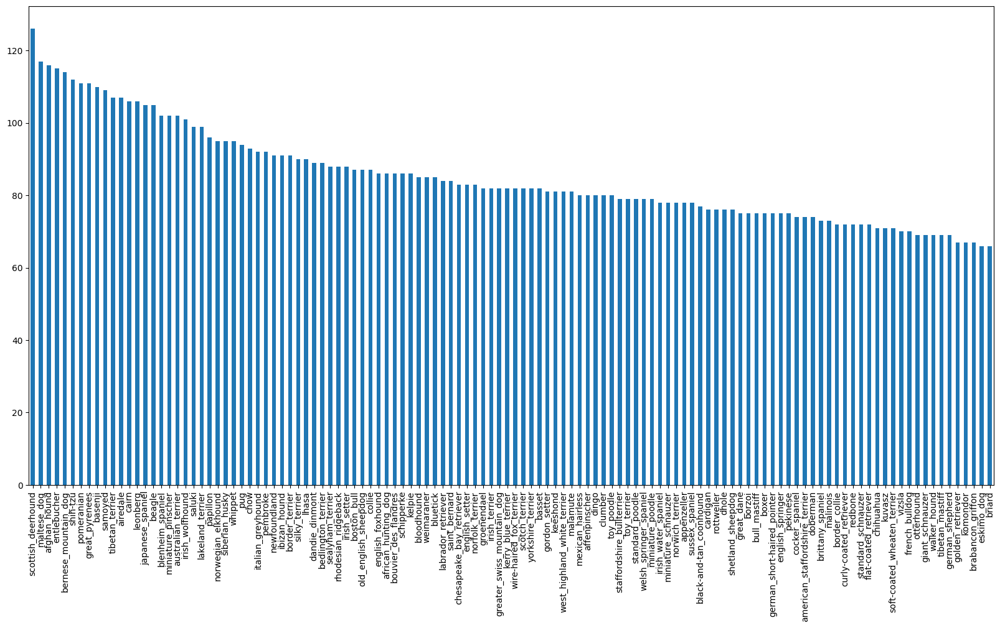

In [ ]:
#to check the number of images in each class
data["breed"].value_counts().plot.bar(figsize=(20,10))

In [ ]:


data.tail()

,id,breed
10217,ffd25009d635cfd16e793503ac5edef0,borzoi
10218,ffd3f636f7f379c51ba3648a9ff8254f,dandie_dinmont
10219,ffe2ca6c940cddfee68fa3cc6c63213f,airedale
10220,ffe5f6d8e2bff356e9482a80a6e29aac,miniature_pinscher
10221,fff43b07992508bc822f33d8ffd902ae,chesapeake_bay_retriever


In [ ]:
#to Check the mean of the given breed
data["breed"].value_counts().mean()


85.18333333333334

In [ ]:
data["breed"].value_counts().median()

82.0

**Preparing The Images**

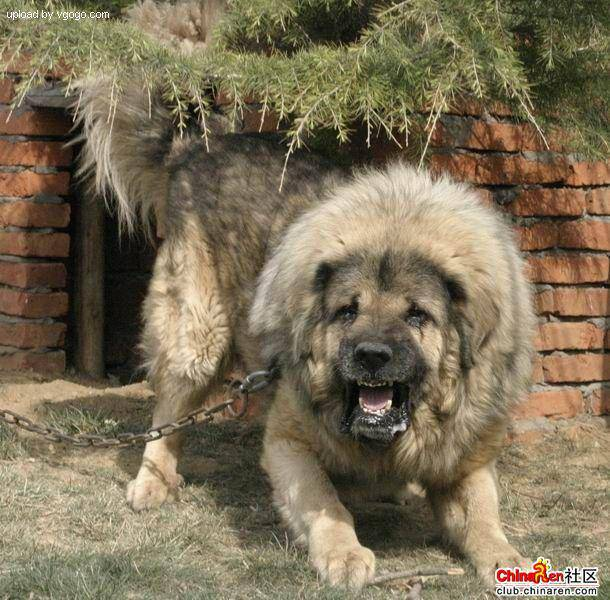

In [ ]:
from IPython.display import Image
Image("/content/drive/MyDrive/Colab Notebooks/DogBreedid/train/e20e32bf114141e20a1af854ca4d0ecc.jpg")

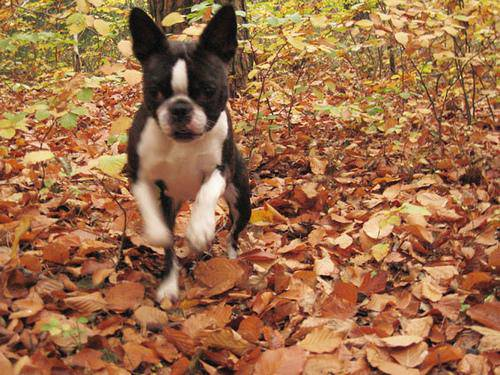

In [ ]:
Image("/content/drive/MyDrive/Colab Notebooks/DogBreedid/train/000bec180eb18c7604dcecc8fe0dba07.jpg")

In [ ]:
filenames = ["/content/drive/MyDrive/Colab Notebooks/DogBreedid/train/"+ fname + ".jpg" for fname in data["id"]]
filenames[:10]

['/content/drive/MyDrive/Colab Notebooks/DogBreedid/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/Colab Notebooks/DogBreedid/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/Colab Notebooks/DogBreedid/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/Colab Notebooks/DogBreedid/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/Colab Notebooks/DogBreedid/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/drive/MyDrive/Colab Notebooks/DogBreedid/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/drive/MyDrive/Colab Notebooks/DogBreedid/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/drive/MyDrive/Colab Notebooks/DogBreedid/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/drive/MyDrive/Colab Notebooks/DogBreedid/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '/content/drive/MyDrive/Colab Notebooks/DogBreedid/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

**IT would be tough each and every time to copy the path so we create a list of all the breeds,s** **ids** (PATHNAMES)

**To check if the images that are driven in the drive are matching to the Original data or not**

In [ ]:
import os
if len(os.listdir("/content/drive/MyDrive/Colab Notebooks/DogBreedid/train/"))==len(filenames):
  print("matched you can proceed")
else:
    print("filenames mismatched")


matched you can proceed


In [ ]:

os.listdir("/content/drive/MyDrive/Colab Notebooks/DogBreedid/train/")[:10]

['dc9e5324fa4d1b4cdeede9b031d3fdf1.jpg',
 'e57c7aad6b6851575b78e7a692df7ca3.jpg',
 'dd19ba0779065dbab0c28842fdf5851f.jpg',
 'e748f61d39da506904f531c7732df512.jpg',
 'e34ee9dce9546a1b520c1c8a3badb605.jpg',
 'e13bcf54507eaba884de1faea9af4dd9.jpg',
 'e3b8f3589a7286ebe017300bf780c279.jpg',
 'e483418ed3331b5bdbd39cf4539fbfb5.jpg',
 'e146cabda18bbb2cb402dece1a7dd4ef.jpg',
 'e03f2a3e636ea5900f5c57ca7c7af68c.jpg']

In [ ]:




if len(os.listdir("/content/drive/MyDrive/Colab Notebooks/DogBreedid/train/"))==len(filenames):
  print("matched you can proceed")
else:
    print("filenames mismatched")


matched you can proceed


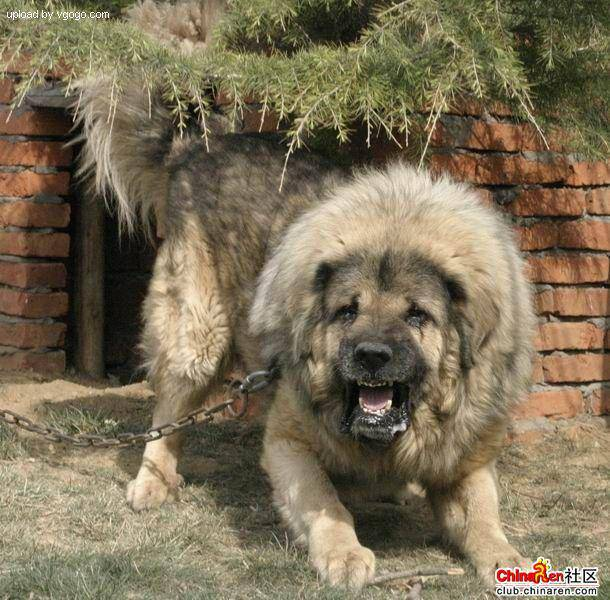

In [ ]:


Image(filenames[9000])

In [ ]:
data["id"][9000]

'e20e32bf114141e20a1af854ca4d0ecc'

In [ ]:
data["breed"][9000]

'tibetan_mastiff'

In [ ]:
labels = data["breed"].to_numpy()

In [ ]:
#Checking if the numbers of labels matches the number of classes
if len(labels)==len(filenames):
  print("matched")
else:
  print("Not Matched")

matched


**Checking for the Unique elements**

In [ ]:
import numpy as np

Unique_breeds = np.unique(labels)
Unique_breeds


array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [ ]:
len(labels)

10222

In [ ]:
print(labels[1])
labels[1] ==Unique_breeds

dingo


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
#Converting all labels to array of boolean
Boolean_labels = [label ==Unique_breeds  for label in labels]
Boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
len(Boolean_labels)

10222

In [ ]:
#Example of turning labels
print(labels[0])
print(np.where(labels[0]==Unique_breeds))
print(Boolean_labels[0].argmax()) #for prnting where the label occurs in boolean array
print(Boolean_labels[0].astype(int)) #for printing 1 if exist

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
#setting some no of images for the experimenting
NUM_IMG =1000   #@param{type:"slider",min:1000,max:10000,step:500}

**Creating Our Own Valdation set**

In [ ]:
from sklearn.model_selection import train_test_split
X = filenames
y = Boolean_labels


In [ ]:
X_train,X_val,y_train,y_val = train_test_split(X[:NUM_IMG],
                                               y[:NUM_IMG],
                                               test_size = 0.2,
                                               random_state= 32)

In [ ]:
len(X_train)

800

In [ ]:
len(X_val)

200

In [ ]:
len(y_train)

800

In [ ]:
y_train[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

**Preprocessing (turning images or audio files into Tensors)**

**Tensors are Numerical representation just like matrix**

*Were going to create a function

1)take a filepath of image as input

2)Use Tensorflow to read the image and save it to Variable

3)Turn the image(jpg) to Tensors

4) Resize the image to the Shape (224,224)

5) Return the Image that is modified

In [ ]:
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [ ]:
images=imread(filenames[1])
images.min(),image.max()  #RGB values varies from 255 to min 0

(0, 255)

array([[[111,  56,  51],
        [106,  51,  46],
        [114,  59,  54],
        ...,
        [ 76,  25,  21],
        [ 76,  25,  21],
        [ 76,  25,  21]],

       [[100,  45,  40],
        [102,  47,  42],
        [108,  53,  48],
        ...,
        [ 75,  24,  20],
        [ 75,  24,  20],
        [ 75,  24,  20]],

       [[105,  50,  45],
        [110,  55,  50],
        [106,  51,  46],
        ...,
        [ 72,  23,  18],
        [ 72,  23,  18],
        [ 72,  23,  18]],

       ...,

       [[ 46,  22,  22],
        [ 41,  20,  19],
        [ 53,  29,  29],
        ...,
        [ 79,  34,  28],
        [ 78,  33,  27],
        [ 77,  32,  26]],

       [[ 48,  22,  23],
        [ 41,  17,  17],
        [ 50,  26,  26],
        ...,
        [ 79,  34,  28],
        [ 78,  33,  27],
        [ 77,  32,  26]],

       [[ 51,  23,  22],
        [ 41,  15,  14],
        [ 47,  21,  20],
        ...,
        [ 79,  34,  28],
        [ 78,  33,  27],
        [ 77,  32,  26]]], dtype=uint8)
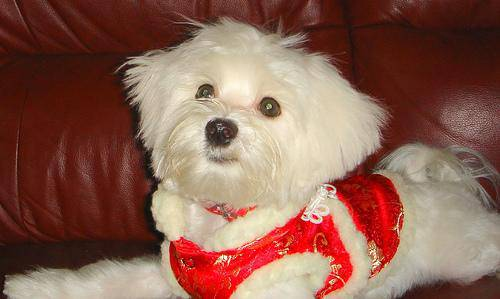

In [ ]:
imread(filenames[12])

In [ ]:
tf.constant(images)[:2] #this is how an image looks in a tensor

<tf.Tensor: shape=(2, 500, 3), dtype=uint8, numpy=
array([[[ 51,  34,  26],
        [ 55,  38,  30],
        [ 61,  43,  33],
        ...,
        [127,  92,  62],
        [ 77,  42,  12],
        [167, 132, 102]],

       [[ 63,  44,  37],
        [ 64,  46,  36],
        [ 63,  45,  35],
        ...,
        [113,  82,  54],
        [ 44,  13,   0],
        [ 71,  40,  12]]], dtype=uint8)>

In [ ]:
images[:2]

array([[[ 51,  34,  26],
        [ 55,  38,  30],
        [ 61,  43,  33],
        ...,
        [127,  92,  62],
        [ 77,  42,  12],
        [167, 132, 102]],

       [[ 63,  44,  37],
        [ 64,  46,  36],
        [ 63,  45,  35],
        ...,
        [113,  82,  54],
        [ 44,  13,   0],
        [ 71,  40,  12]]], dtype=uint8)

***Creating a Function and lets preprocess the Image***

In [ ]:
I_size  = 224 #Size of imafe will be 224h 224w
#creating a function for the preprocessing
def pre_process(image_path,img_size=224):
  "takes an image and turns into the tensors"

  #reads  the input image
  img = tf.io.read_file(image_path)

  #turn the inpt image to Numericall Tensor with 3 color channels (RGB)
  img = tf.image.decode_jpeg(img,channels=3)

  #turn the color channel from 0-255 to 0-1
  img = tf.image.convert_image_dtype(img,tf.float32)


  #now Resize the height and width of the Image
  img = tf.image.resize(img , size=(224,224))
  return img



**Taking the Data into batches for performance constraints**

In [ ]:
#the default batchsize in 32 and we can adjust it manually

In [ ]:
def get_image_label(image_path,label):
  " takes images filepath name associated with label processess and returns the tuple"
  image = pre_process(image_path)
  return image,label


In [ ]:
(pre_process(X[23]) ,tf.constant(y[23]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.85505086, 0.9299633 , 0.92662823],
         [0.81137955, 0.8680409 , 0.87331927],
         [0.65585613, 0.7117472 , 0.72351193],
         ...,
         [0.9862923 , 1.        , 0.94612277],
         [0.98783255, 1.        , 0.96510875],
         [0.9843138 , 1.        , 0.9686275 ]],
 
        [[0.90201336, 0.96589917, 0.96203256],
         [0.6755214 , 0.7345071 , 0.734637  ],
         [0.3105466 , 0.35756877, 0.36488315],
         ...,
         [0.97476614, 0.98050165, 0.94970876],
         [0.9842786 , 0.9984056 , 0.97540545],
         [0.98680484, 0.99697757, 0.9817803 ]],
 
        [[0.9601525 , 0.99129385, 0.982579  ],
         [0.68598783, 0.7250213 , 0.71138334],
         [0.2921741 , 0.32173467, 0.32030183],
         ...,
         [0.9958709 , 0.99332947, 0.99219996],
         [0.9956618 , 0.99824065, 0.9963235 ],
         [0.99748373, 0.9966649 , 0.9973658 ]],
 
        ...,
 
        [[0.9354203 , 0.91764134

**Creating function for turining into the batches**

In [ ]:
def data_batches(X,y=None,test_data=False,valid_data=False,batch_size=32):
  batch_size = 32
  """
  creates the data batches of image_paths and labels
  shuffles if the images of Training data but doesnt shuffles if its on validation
  also accepts the test data as input  with no labels
  """
  #in test we dont have labels
  if test_data:
    print("creating the test data")
    data = tf.data.Dataset.from_tensor_slices((tf.constantt(X)))
    data_batch = data.map(pre_process).batch(batch_size)
    return data_batch
  elif valid_data:
    print("creating validation data")
    data= tf.data.Dataset.from_tensor_slices((tf.constant(X),tf.constant(y)))
    data_batch = data.map(get_image_label).batch(batch_size)
    return data_batch
  else:
    print("creating training data")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),tf.constant(y)))
    data = data.shuffle(buffer_size=len(X))
    data = data.map(get_image_label)
    data_batch = data.batch(batch_size)
  return data_batch



In [ ]:
train_data = data_batches(X_train,y_train)
val_data = data_batches(X_val,y_val,valid_data = True)

creating training data
creating validation data


In [ ]:
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

**Visualizing the Data**

In [ ]:
import matplotlib.pyplot as plt
#lets set 15 images in eah batch
def show_15_images(images,labels):
  """
  looping throught the 15 imges and labels from their batches
  """
  plt.figure(figsize=(10,10))
  for i in range(15):
    #creating subplots

    ax = plt.subplot(5,5,i+1)
    #displayinng images
    plt.imshow(images[i])
    #adding the image label as title
    plt.title(Unique_breeds[labels[i].argmax()])
    plt.axis("off")





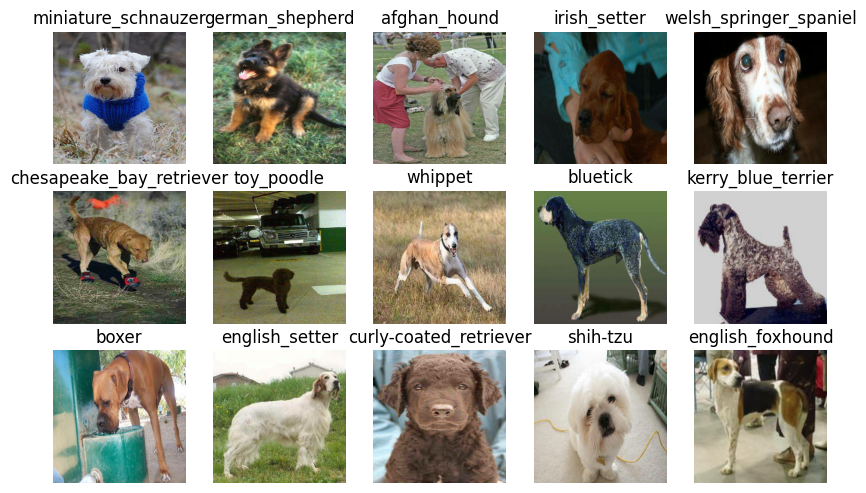

In [ ]:
#Images from the training batch set and the images gets shuffled in every cell run
train_images , train_labels = next(train_data.as_numpy_iterator())
show_15_images(train_images,train_labels)

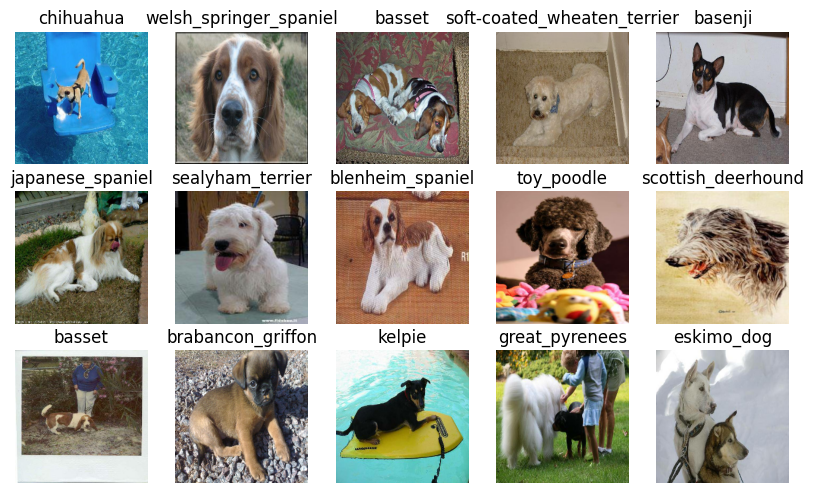

In [ ]:
#these are the validation batch images.. in every cell run the images wont shuffle as we didnt allowd shuffle in the above function
val_images,val_labels = next(val_data.as_numpy_iterator()) #
show_15_images(val_images,val_labels)

**Building a model to predict**
before that we need to give a input_shape , Output_shape and URL of the model

In [ ]:
input_shape = [None,224,224,3]
output_shape = len(Unique_breeds)
model_url = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

creating a function for the input and output and for model
* Defines the layers in keras in sequencetial manner

* compiles the model

* Builds the model  

* Returns the model

In [ ]:
def create_model(Input_shape = input_shape,op_shape = output_shape,Model_url = model_url):
  print("building",model_url)
  #setting the layers
  model = tf.keras.Sequential([hub.KerasLayer(model_url), #layer1 input layer
                              tf.keras.layers.Dense(units=output_shape,
                              activation = 'softmax') #layer 2 output layer
  ])
  #compiles the model
  model.compile(
      loss = tf.keras.losses.CategoricalCrossentropy(),
      optimizer = tf.keras.optimizers.Adam(), #ADAPTIVE MOMENT ESTIMATION
      metrics=["accuracy"]
  )
  #building the model
  model.build(Input_shape) #size of images that mobilenetv2 is trained
  return model



In [ ]:
model = create_model()
model.summary()

building https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


**Creating callbacks**
callbacks are  helper functions that the model uses to save the progress and check the progress and stop the trainig if theres no any improvement

creating 2 callbacks 1 for saving the progress (tensorboard) and another for stopping the training if its too long

* to setup the tensorboad extention

1) load the extension

2) Create a tensorboard callback that enablles tosave logs in dir
and pass to our models fit function
3) visuaize the model training logs using tensorboard magic funtion

In [ ]:
#loading tensorboard
#for loading tensorboad extenstion
%load_ext tensorboard

In [ ]:
import datetime
#creating the fun to build the Tensorboard
def create_callback():
  #creaating the log dir to store the tensorboard logs
  logdir = os.path.join("/content/drive/MyDrive/Colab Notebooks/DogBreedid/logs",datetime.datetime.now().strftime("%y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir )

Creating another callback for stopping the model from overfitting Earlyatopping()


In [ ]:
early_stopping  = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy',patience=10)

training on a subset of data 1000 images

In [ ]:
NUM_EPOCHS = 50 #@param{type:'slider',min:10,max:1000}

Creating a function that trains a model

*create a model using create_model()

*Setup a tensorBoard call back using c_ten-cb()

*call the fit fun for train val and epoch

*call backs we chose

*return the model



In [ ]:
def train_model():
  model = create_model()
  #creating tensorboard
  tensorboard =create_callback()
  model.fit(x=train_data,
           epochs = NUM_EPOCHS,
           validation_data = val_data,validation_freq = 1, callbacks=[tensorboard,early_stopping])
  return model

In [ ]:
model = train_model()

building https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/50
25/25 [==============================] - 190s 7s/step - loss: 4.3992 - accuracy: 0.1063 - val_loss: 3.4124 - val_accuracy: 0.2200
Epoch 2/50
25/25 [==============================] - 6s 225ms/step - loss: 1.5492 - accuracy: 0.7150 - val_loss: 2.1261 - val_accuracy: 0.5000
Epoch 3/50
25/25 [==============================] - 4s 167ms/step - loss: 0.5305 - accuracy: 0.9475 - val_loss: 1.7239 - val_accuracy: 0.5750
Epoch 4/50
25/25 [==============================] - 4s 145ms/step - loss: 0.2372 - accuracy: 0.9912 - val_loss: 1.5330 - val_accuracy: 0.6050
Epoch 5/50
25/25 [==============================] - 5s 215ms/step - loss: 0.1379 - accuracy: 1.0000 - val_loss: 1.4432 - val_accuracy: 0.6350
Epoch 6/50
25/25 [==============================] - 4s 167ms/step - loss: 0.0949 - accuracy: 1.0000 - val_loss: 1.4050 - val_accuracy: 0.6300
Epoch 7/50
25/25 [==============================] - 5s 191ms/step - 

Checking the tensorboard Logs
using the magic function %tensorboard will access the logs that we created and to visualize its content

In [ ]:
%tensorboard --logdir content/drive/MyDrive/Colab\ Notebooks/DogBreedid/logs


<IPython.core.display.Javascript object>

In [ ]:
predictions  = model.predict(val_data,verbose=1)
predictions

7/7 [==============================] - 2s 114ms/step


array([[8.9389918e-04, 1.3927271e-05, 5.9064873e-04, ..., 2.1825586e-03,
        1.4875915e-04, 2.1913694e-04],
       [3.1095749e-06, 2.9665194e-04, 1.0815974e-05, ..., 3.1901939e-06,
        4.6794245e-04, 1.7037904e-05],
       [2.9992791e-06, 3.0091605e-06, 3.2450589e-07, ..., 3.4465404e-06,
        7.1989292e-05, 3.1390315e-05],
       ...,
       [3.1390129e-05, 2.9238902e-07, 3.2224294e-04, ..., 8.6092883e-01,
        3.6195277e-05, 5.3473536e-06],
       [7.3817464e-05, 3.9008025e-02, 2.0722048e-04, ..., 4.4752238e-03,
        1.3419855e-01, 1.7116301e-05],
       [1.7689458e-06, 3.5836155e-07, 1.7607090e-06, ..., 2.9430419e-06,
        3.6304908e-07, 2.4962785e-05]], dtype=float32)

In [ ]:
predictions.shape

(200, 120)

In [ ]:
len(y_val)

200

In [ ]:
np.sum(predictions[0])

1.0

In [ ]:
index =76

print(predictions[index])
print("max prob of predictions",np.max(predictions[index]))
print("sum of prob",np.sum(predictions[index]))
print("max index",np.argmax(predictions[index]))
print("predicted label",Unique_breeds[np.argmax(predictions[index])])

[9.7969496e-06 2.3076414e-05 9.7584450e-01 8.5731308e-06 1.0223080e-05
 8.1325752e-06 2.3399969e-05 1.4064547e-04 2.3835032e-06 3.7052967e-05
 3.2570781e-05 2.6668817e-05 1.7186707e-05 5.5006194e-06 1.8693750e-05
 4.0726642e-05 4.7637204e-05 1.4134291e-04 2.5359271e-04 9.3874056e-05
 6.9820871e-06 7.2054645e-05 1.4810774e-06 1.7725202e-05 2.2353721e-05
 3.0231142e-05 3.8515823e-04 2.6510117e-04 1.3093550e-05 7.0470123e-05
 1.5057322e-05 2.3172045e-06 7.6434544e-06 7.6997812e-06 2.5988849e-05
 5.6049892e-05 4.7420589e-03 1.3192457e-03 3.4807483e-05 2.4310073e-04
 5.1175983e-05 4.1493680e-05 5.6448544e-04 6.4977203e-06 3.3608105e-04
 2.0735593e-05 1.8067574e-04 1.9566507e-04 1.5655585e-05 5.6120361e-06
 7.5116935e-05 9.8113588e-04 1.0482504e-05 6.1219376e-05 1.0444052e-04
 4.1961117e-04 3.8833960e-04 3.5493282e-05 2.5850595e-05 4.9998354e-05
 2.9554745e-04 4.8793216e-05 2.4592152e-04 3.8727571e-06 1.5584314e-06
 1.7674867e-05 9.2984788e-04 2.0311776e-05 2.0170773e-06 1.0326964e-04
 2.184

In [ ]:
def get_pred_labels(predictions_prob):
  return Unique_breeds[np.argmax(predictions_prob)]
pred_label = get_pred_labels(predictions[0])
pred_label

'basenji'

In [ ]:
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and returns separate arrays
  of images and labels.
  """
  images = []
  labels = []
  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(Unique_breeds[np.argmax(label)])
  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.16123949, 0.5533964 , 0.6788866 ],
         [0.1827031 , 0.57486   , 0.70035017],
         [0.196128  , 0.5882849 , 0.7137751 ],
         ...,
         [0.17362626, 0.5139023 , 0.596823  ],
         [0.12144795, 0.5194187 , 0.6078984 ],
         [0.11841376, 0.53410006, 0.62037456]],
 
        [[0.16719642, 0.56327486, 0.6809219 ],
         [0.15776013, 0.55383855, 0.6714856 ],
         [0.14778373, 0.54386216, 0.6615092 ],
         ...,
         [0.15516306, 0.49736187, 0.60306394],
         [0.16081475, 0.5631959 , 0.65406144],
         [0.09440336, 0.5100897 , 0.60420734]],
 
        [[0.1597339 , 0.55581236, 0.6734594 ],
         [0.11379905, 0.5098775 , 0.62752455],
         [0.16361757, 0.559696  , 0.6773431 ],
         ...,
         [0.21408445, 0.56579137, 0.6968751 ],
         [0.14985083, 0.5576066 , 0.6604252 ],
         [0.11968762, 0.54074854, 0.64024085]],
 
        ...,
 
        [[0.14365608, 0.52796984, 0.62600905],
         [0.1893058 , 0.58811533, 0.67890

**Visualizing the images**

Prediction labels
Validation labels (truth labels)
Validation images
Let's make some functions to make these all a bit more visualize.

More specifically, we want to be able to view an image, its predicted label and its actual label (true label).

The first function we'll create will:

Take an array of prediction probabilities, an array of truth labels, an array of images and an integer.
Convert the prediction probabilities to a predicted label.
Plot the predicted label, its predicted probability, the truth label and target image on a single plot.

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=5):
  """
  View the prediction, ground truth label and image for sample n.
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_labels(pred_prob)

  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

 # Change the color of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  plt.title("{} {:2.0f}% ({})".format(pred_label,
                                      np.max(pred_prob)*100,
                                      true_label),
                                      color=color)

**Predictions on Validation data**

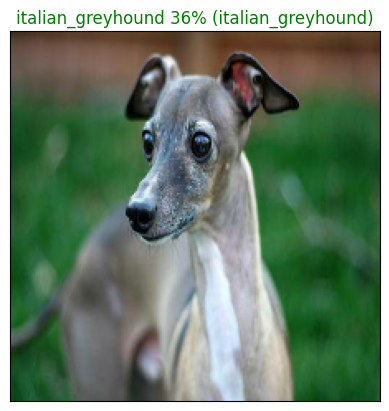

In [ ]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,n=19)

**To check all the top predictions**
* create another function to return top 10 predictions using pred_label and truth_label

* find predicted label using get_pred_labels()

* indexes, labels integer

In [ ]:
def plot_pred_conf(prediction_probabilities,labels,n=1):
  pred_prob,turth_labels = prediction_probabilities[n],labels[n]
  #get predicted labels
  pred_labels = get_pred_labels(pred_prob)
  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labels

  top_10_pred_labels = Unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  # Change color of true label
  if np.isin(turth_labels, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == turth_labels)].set_color("green")
  else:
    pass


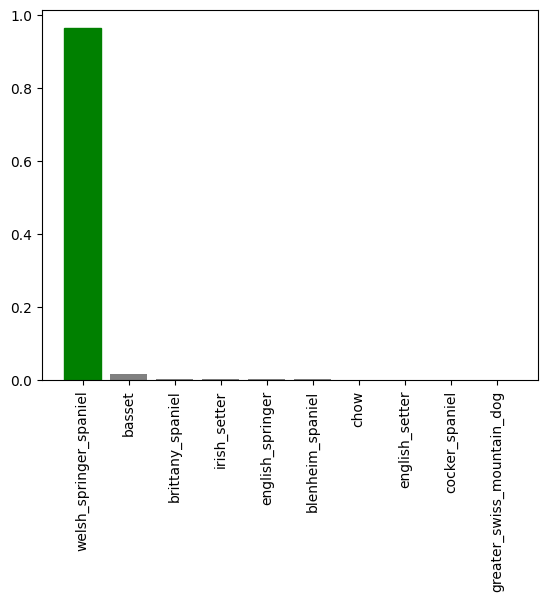

In [ ]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,n=18)

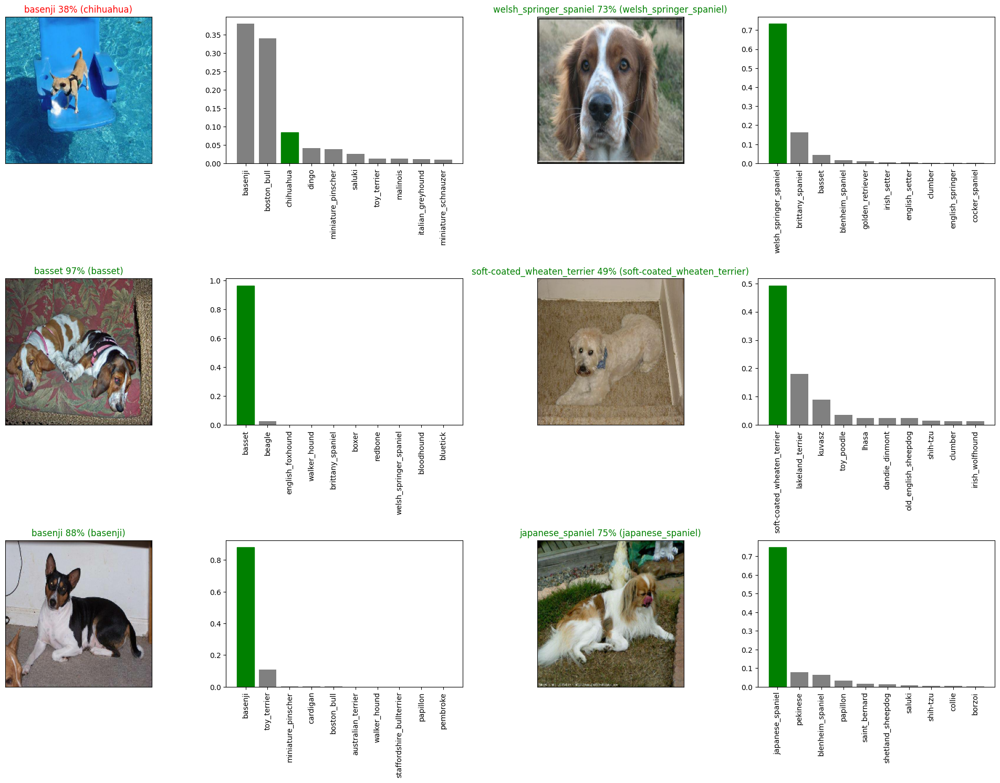

In [ ]:
i_multiplier = 0
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(5*2*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                labels=val_labels,
                n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()
